In [1]:
# importing all important libraries

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
from datetime import datetime
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose
import warnings
from scipy import stats

warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv(r"Retail_Data_Kaggle\file_out.csv")
data.drop(columns=["Unnamed: 0"],axis=1,inplace=True)
data.head()

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity
0,716,2019-09-23,1039,381.78,67.37254,1,1.0
1,716,2019-09-23,853,593.22,0.00034,1,1.0
2,716,2019-09-23,862,423.73,-0.00119,1,1.0
3,716,2019-09-23,868,201.70,35.58814,1,1.0
4,716,2019-09-23,2313,345.76,61.01966,1,1.0


### Data Description

> DocumentID : ID of the transaction. A transaction might hold multiple records for the same customer at the same date with multiple products (SKU). DocumentID might be useful for combining the transactions and detecting the items sold together.

> Date : Date of transaction / sell. In the date time format.

> SKU : Item / Product code. The unique code for each item sold.

> Price : Sales price for the transaction. The price for the product for the customer for the date.

> Discount : discount amount for the transaction.

> Customer : Unique customer id for each customer. For the data set, customer can be a reseller or a branch of the company.

> Quantity : Number of items sold in the transaction.


<h4 style="color:red"> ASSUMPTION : - As we don't have FC ( Fulfillment Center ) details , We're gonna consider all the records are from same FC </h4>

In [3]:
data.index

RangeIndex(start=0, stop=33356, step=1)

In [4]:
data.columns

Index(['DocumentID', 'Date', 'SKU', 'Price', 'Discount', 'Customer',
       'Quantity'],
      dtype='object')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33356 entries, 0 to 33355
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DocumentID  33356 non-null  int64  
 1   Date        33356 non-null  object 
 2   SKU         33356 non-null  int64  
 3   Price       33356 non-null  float64
 4   Discount    33356 non-null  float64
 5   Customer    33356 non-null  int64  
 6   Quantity    33356 non-null  float64
dtypes: float64(3), int64(3), object(1)
memory usage: 1.8+ MB


In [6]:
data.describe()

,DocumentID,SKU,Price,Discount,Customer,Quantity
count,33356.000000,33356.000000,33356.000000,33356.000000,33356.000000,33356.000000
mean,8227.577227,1241.273174,2915.716875,591.249968,307.968581,5.760695
std,4028.047727,893.872164,10285.512325,3508.983569,162.675166,19.550559
min,0.000000,0.000000,0.000000,-0.004920,0.000000,0.000000
25%,5399.750000,503.000000,661.016949,95.674576,179.000000,2.000000
50%,8733.000000,1008.000000,1203.389830,195.254237,286.000000,4.000000
75%,10857.000000,2078.250000,2572.194915,423.489661,427.000000,4.000000
max,15751.000000,2904.000000,522767.340000,240396.660000,605.000000,1246.000000


In [7]:
data.isnull().sum()

DocumentID    0
Date          0
SKU           0
Price         0
Discount      0
Customer      0
Quantity      0
dtype: int64

In [8]:
# Calculate unique counts
uniques = [len(data[col].unique()) for col in data.columns]

# Create a new DataFrame for visualization
freq_data = pd.DataFrame({'Feature': data.columns, 'Unique Count': uniques})

# Create a bar plot using Plotly Express
fig = px.bar(freq_data, x='Feature', y='Unique Count', color='Feature',
             labels={'Unique Count': 'Unique Count', 'Feature': 'Feature'},
             title='Number of unique per feature')

# Add text labels on top of the bars
for i, uniq in enumerate(uniques):
    fig.add_annotation(x=freq_data['Feature'][i], y=uniq + 10,
                       text=str(uniq), showarrow=False,
                       font=dict(color='black', size=12))

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=45)

# Show the plot
fig.show()

###### Before performing any sort of analysis let's convert the data type of date to datetime

In [9]:
# let's convert the date object to datetime

data["Date"] = pd.to_datetime(data["Date"])
data.head()

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity
0,716,2019-09-23,1039,381.78,67.37254,1,1.0
1,716,2019-09-23,853,593.22,0.00034,1,1.0
2,716,2019-09-23,862,423.73,-0.00119,1,1.0
3,716,2019-09-23,868,201.70,35.58814,1,1.0
4,716,2019-09-23,2313,345.76,61.01966,1,1.0


* To understand how many years worth of data we've and to know how many records we have each month per year, let's try to extract some features like year, quarter, month and etc 

In [10]:
# extracting year,quarter,month, week from the Date feature

data["year"] = data["Date"].dt.year
data["quarter"] = data["Date"].dt.quarter
data["month"] = data["Date"].dt.month
data["week"] = data["Date"].dt.isocalendar().week
data["day"] = data["Date"].dt.day

In [11]:
# data available for

print(f"Data available for {data['year'].unique()} years")

Data available for [2019 2020 2021 2022] years


In [12]:
# data range

print(f"We have records starting from {data['Date'].min()} to {data['Date'].max()}")

We have records starting from 2019-01-01 00:00:00 to 2022-11-09 00:00:00


In [13]:
# let's manually explore to undertand the frequency of the data

data.head(10)

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity,year,quarter,month,week,day
0,716,2019-09-23,1039,381.78,67.37254,1,1.0,2019,3,9,39,23
1,716,2019-09-23,853,593.22,0.00034,1,1.0,2019,3,9,39,23
2,716,2019-09-23,862,423.73,-0.00119,1,1.0,2019,3,9,39,23
3,716,2019-09-23,868,201.70,35.58814,1,1.0,2019,3,9,39,23
4,716,2019-09-23,2313,345.76,61.01966,1,1.0,2019,3,9,39,23
5,716,2019-09-23,2355,406.78,101.69458,1,1.0,2019,3,9,39,23
6,716,2019-09-23,2529,542.38,135.58610,1,1.0,2019,3,9,39,23
7,460,2019-04-13,2361,13983.05,0.00000,460,6.0,2019,2,4,15,13
8,461,2019-04-27,2723,30.00,0.00000,479,1.0,2019,2,4,17,27
9,462,2019-05-30,655,2500.00,0.00000,26,1.0,2019,2,5,22,30


In [14]:
# probably the data is not sorted, so let's sort the data using Date

data.sort_values(by=["Date"],inplace=True)

In [15]:
# now take a loot at the data

data.head(10)

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity,year,quarter,month,week,day
9791,14602,2019-01-01,2647,635.593220,114.406780,211,1.0,2019,1,1,1,1
8796,7229,2019-01-02,371,1498.000000,269.640000,512,4.0,2019,1,1,1,2
8797,7230,2019-01-02,130,403.889831,72.700169,57,1.0,2019,1,1,1,2
3867,3529,2019-01-02,993,621.533898,111.876102,238,1.0,2019,1,1,1,2
9544,66,2019-01-02,2775,1100.000000,0.000000,220,2.0,2019,1,1,1,2
8794,7227,2019-01-02,2383,323.898305,58.301695,512,1.0,2019,1,1,1,2
8795,7228,2019-01-02,1116,1041.245763,187.424237,57,1.0,2019,1,1,1,2
3891,3545,2019-01-02,884,627.118644,112.881356,139,4.0,2019,1,1,1,2
3890,3544,2019-01-02,2528,198.305085,35.694915,604,1.0,2019,1,1,1,2
3889,3543,2019-01-02,1234,440.677966,79.322034,350,1.0,2019,1,1,1,2


* We've the data on daily frequency, so let's deep dive a little bit.

In [16]:
# exploring the data on a specific day to understand more about the data

temp = data[data["Date"]=="2019-01-02"]
temp

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity,year,quarter,month,week,day
8796,7229,2019-01-02,371,1498.000000,269.640000,512,4.0,2019,1,1,1,2
8797,7230,2019-01-02,130,403.889831,72.700169,57,1.0,2019,1,1,1,2
3867,3529,2019-01-02,993,621.533898,111.876102,238,1.0,2019,1,1,1,2
9544,66,2019-01-02,2775,1100.000000,0.000000,220,2.0,2019,1,1,1,2
8794,7227,2019-01-02,2383,323.898305,58.301695,512,1.0,2019,1,1,1,2
8795,7228,2019-01-02,1116,1041.245763,187.424237,57,1.0,2019,1,1,1,2
3891,3545,2019-01-02,884,627.118644,112.881356,139,4.0,2019,1,1,1,2
3890,3544,2019-01-02,2528,198.305085,35.694915,604,1.0,2019,1,1,1,2
3889,3543,2019-01-02,1234,440.677966,79.322034,350,1.0,2019,1,1,1,2
3888,3542,2019-01-02,1793,796.610169,143.389831,179,4.0,2019,1,1,1,2


* We can observe some sort of duplicates in the data like few records have same SKU ID & Customer but different Price for a same date (see SKU with ID 166 ), so we can combine these type of records to make into one record.

* Even if we've different records for same SKU on a single day ( Customer might be different ), we're going to combine those records also. Checkout the records with SKU ID with 884 for more. 

In [17]:
temp["SKU"].value_counts()

SKU
166     2
884     2
371     1
1644    1
2310    1
2130    1
2416    1
1136    1
2418    1
374     1
2039    1
975     1
220     1
2173    1
224     1
215     1
130     1
978     1
976     1
1408    1
1443    1
1793    1
1234    1
2528    1
1116    1
2383    1
2775    1
993     1
118     1
Name: count, dtype: int64

* We can see for the SKUs with ID 166 & 884 has multiple records on a single day ( Again we're not worrying customer because demand forecasting is going to be a general level not customer level ) 

* After performing some EDA on customer level, we'll combine the records and remove Customer feature, so as of now let's continue. 

###### Analyzing data by DocumentID

In [18]:
temp["DocumentID"].value_counts()

DocumentID
3541    4
3535    3
3539    3
3530    2
7229    1
3546    1
3537    1
3536    1
3531    1
3534    1
3533    1
3532    1
3540    1
7230    1
3542    1
3543    1
3544    1
3545    1
7228    1
7227    1
66      1
3529    1
3538    1
Name: count, dtype: int64

* We've duplicates in DocumentID also, but let's take a deeper look to figure out the reason for duplicates.

In [19]:
temp[temp["DocumentID"]==3541]

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity,year,quarter,month,week,day
3887,3541,2019-01-02,1443,1000.000000,180.000000,596,4.0,2019,1,1,1,2
3886,3541,2019-01-02,1408,796.610169,143.389831,596,4.0,2019,1,1,1,2
3885,3541,2019-01-02,976,830.508475,149.491525,596,4.0,2019,1,1,1,2
3884,3541,2019-01-02,978,762.711864,137.288136,596,4.0,2019,1,1,1,2


* If you can see the DocumentID & Customer is same for all the above records ( SKUs are different ), so it might be like a customer brought different SKUs in single transaction but the data are stored by SKU level. This will also be solved once we combine the records by SKU ID & day

In [20]:
temp["Customer"].value_counts()

Customer
596    4
99     3
447    3
512    2
22     2
57     2
323    1
66     1
266    1
161    1
159    1
351    1
292    1
82     1
179    1
350    1
604    1
139    1
220    1
238    1
284    1
Name: count, dtype: int64

In [21]:
temp[temp["Customer"]==512]

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity,year,quarter,month,week,day
8796,7229,2019-01-02,371,1498.000000,269.640000,512,4.0,2019,1,1,1,2
8794,7227,2019-01-02,2383,323.898305,58.301695,512,1.0,2019,1,1,1,2


* By observing the above records, we can infer that customers might also buy different items individually on the same day. ( Just an observation, this is nothing to with demand forecasting )

# Exploratory Data Analysis

In [22]:
data.dtypes

DocumentID             int64
Date          datetime64[ns]
SKU                    int64
Price                float64
Discount             float64
Customer               int64
Quantity             float64
year                   int32
quarter                int32
month                  int32
week                  UInt32
day                    int32
dtype: object

In [23]:
# let's convert DocumentID, SKU, Customer, Year, Quarter, Month, Week, day to object type or str 

data[["DocumentID","SKU","Customer","year","quarter","month","week","day"]] = data[["DocumentID","SKU","Customer","year","quarter","month","week","day"]].astype(str)

In [24]:
# figuring out how many items bought in single transaction

data["DocumentID"].value_counts()

DocumentID
14558    98
0        72
7219     56
10096    56
906      36
         ..
2473      1
2471      1
656       1
2468      1
13319     1
Name: count, Length: 15752, dtype: int64

In [25]:
data["DocumentID"].value_counts().value_counts()

count
1     8706
2     3188
3     1930
4      865
5      365
6      177
7      109
8       77
9       54
12      50
10      43
11      35
13      33
14      24
16      15
17      13
15      11
19      11
18      10
21       7
22       5
23       4
20       3
24       2
28       2
32       2
35       2
56       2
72       1
25       1
26       1
27       1
34       1
36       1
98       1
Name: count, dtype: int64

In [26]:
# Calculating the value counts of each count of DocumentID occurrences
count_counts = data["DocumentID"].value_counts().value_counts()

fig = px.bar(count_counts,
             title='Distribution of Counts of DocumentID')

# Updating layout for better visibility
fig.update_layout(
    xaxis_title='Number of Occurrences of Document ID',
    yaxis_title='Number of Document IDs with the Same Frequency',
)

# Show the plot
fig.show()

* Only 1 item bought in most of the transactions, some transaction has 98 items ( Bought 98 different SKU in single Transaction )

In [27]:
# Grouping by DocumentID and sum the Quantity ( total quantity ordered in that particular transaction )
quantity_by_document = data.groupby('DocumentID')['Quantity'].sum().reset_index()
quantity_by_document.sort_values("Quantity",inplace=True)

fig = px.bar(quantity_by_document, x='DocumentID', y='Quantity', title='Quantity by DocumentID')


fig.update_traces(dict(marker_line_width=0))


fig.show()

In [28]:
# Grouping by DocumentID and sum the Quantity ( total quantity ordered in that particular transaction )
quantity_by_document = data.groupby('DocumentID')['Price'].sum().reset_index()
quantity_by_document.sort_values("Price",inplace=True)

fig = px.bar(quantity_by_document, x='DocumentID', y='Price', title='Price by DocumentID')


fig.update_traces(dict(marker_line_width=0))


fig.show()

In [29]:
transactions_per_day = data.groupby('Date')['DocumentID'].nunique().reset_index()

# Renaming the columns for clarity
transactions_per_day.columns = ['Date', 'Transcations']

fig = px.line(transactions_per_day, x='Date', y='Transcations', title='No of Transactions Per Days')
fig.update_layout(yaxis_title="Transaction Frequency")

fig.show()

In [30]:
# let's see transactn with most value

price_per_transaction  = data.groupby("DocumentID")["Price"].sum().reset_index()
price_per_transaction.sort_values("Price",inplace=True,ascending=False)
price_per_transaction.head()

,DocumentID,Price
4956,14458,1.102457e+06
12664,7219,1.068853e+06
5067,14558,9.954761e+05
5529,14974,9.880577e+05
12666,7220,9.566968e+05


In [31]:
# Grouping by Date and price of SKU's sold on a particular day 

transactions_per_day = data.groupby('Date')['Price'].sum().reset_index()

fig = px.line(transactions_per_day, x='Date', y='Price', title='Price of SKUs Sold in a Day')

fig.update_layout(yaxis_title="Price")

fig.show()

> Please uncomment the below code to execute ( will take some time to execute & plot )

In [32]:
# # Grouping by DocumentID and sum the prices for each transaction

# transaction_values = data.groupby("DocumentID")["Price"].sum().reset_index()
# transaction_values = transaction_values.sort_values(by='Price')

# fig = px.bar(transaction_values, x='DocumentID', y='Price',
#              title='Transaction Values',
#              labels={'Price': 'Transaction Value'},
#              color='DocumentID')  

# # Updating lay for better visibility
# fig.update_layout(
#     xaxis_title='Transaction ID',
#     yaxis_title='Transaction Value',
#     showlegend=False  
# )

# fig.update_traces(dict(marker_line_width=0))


# fig.show()

* Transaction with ID 7219 & 7220 are having highest value ( in terms of price )
* Use the brush functionality to zoom in and to see the observations

In [33]:
# checking wich customer has most transactions

data.groupby("Customer")["DocumentID"].nunique()

Customer
0       16
1       71
10       1
100      1
101      1
      ... 
95       1
96       1
97       6
98      11
99     282
Name: DocumentID, Length: 606, dtype: int64

In [34]:
# Grouping by customer and count the number of transactions
customer_transactions = data.groupby("Customer")["DocumentID"].nunique().reset_index()

# Renaming the columns for clarity
customer_transactions.columns = ['Customer', 'Transaction Count']

# Sorting the DataFrame by transaction count in descending order
customer_transactions = customer_transactions.sort_values(by='Transaction Count')

fig = px.bar(customer_transactions, x='Customer', y='Transaction Count',
             title='Number of Transactions per Customer',
             labels={'Transaction Count': 'Number of Transactions'})

# Updating layout for better visibility
fig.update_layout(
    xaxis_title='Customer ID',
    yaxis_title='Number of Transactions',
)

fig.update_traces(dict(marker_line_width=0))


fig.show()

* Customer with ID 284 has done highest transactions ( 713 )

# Data Cleaning 

In [35]:
data.columns

Index(['DocumentID', 'Date', 'SKU', 'Price', 'Discount', 'Customer',
       'Quantity', 'year', 'quarter', 'month', 'week', 'day'],
      dtype='object')

In [36]:
df = data.drop(columns=["DocumentID","Customer"])
df.head()

,Date,SKU,Price,Discount,Quantity,year,quarter,month,week,day
9791,2019-01-01,2647,635.593220,114.406780,1.0,2019,1,1,1,1
8796,2019-01-02,371,1498.000000,269.640000,4.0,2019,1,1,1,2
8797,2019-01-02,130,403.889831,72.700169,1.0,2019,1,1,1,2
3867,2019-01-02,993,621.533898,111.876102,1.0,2019,1,1,1,2
9544,2019-01-02,2775,1100.000000,0.000000,2.0,2019,1,1,1,2


In [37]:
df.columns

Index(['Date', 'SKU', 'Price', 'Discount', 'Quantity', 'year', 'quarter',
       'month', 'week', 'day'],
      dtype='object')

In [38]:
#defining how to aggregate various fields
agg_functions = {'Price': 'sum',"Quantity":"sum","Discount":"sum","year":"first","quarter":"first","month":"first","week":"first","day":"first"}

#creating new DataFrame by combining rows with same id values
df_new = df.groupby(['Date',"SKU"]).aggregate(agg_functions).reset_index()

df_new.head()

,Date,SKU,Price,Quantity,Discount,year,quarter,month,week,day
0,2019-01-01,2647,635.593220,1.0,114.406780,2019,1,1,1,1
1,2019-01-02,1116,1041.245763,1.0,187.424237,2019,1,1,1,2
2,2019-01-02,1136,1135.593220,4.0,204.406780,2019,1,1,1,2
3,2019-01-02,118,283.898305,1.0,51.101695,2019,1,1,1,2
4,2019-01-02,1234,440.677966,1.0,79.322034,2019,1,1,1,2


###### let's take a SKU having multiple transaction in a single day to verify our groupby operation

In [39]:
temp = data[data["Date"]=="2019-01-02"]
temp["SKU"].value_counts().head()

SKU
166     2
884     2
371     1
1644    1
2310    1
Name: count, dtype: int64

In [40]:
temp[temp["SKU"]=="166"]

,DocumentID,Date,SKU,Price,Discount,Customer,Quantity,year,quarter,month,week,day
3881,3539,2019-01-02,166,1000.0,180.0,447,4.0,2019,1,1,1,2
3880,3539,2019-01-02,166,2000.0,360.0,447,8.0,2019,1,1,1,2


In [41]:
df_new.loc[(df_new["Date"]=="2019-01-02") & (df_new["SKU"]=="166")]

,Date,SKU,Price,Quantity,Discount,year,quarter,month,week,day
9,2019-01-02,166,3000.0,12.0,540.0,2019,1,1,1,2


###### You can see we've successfully combined records, now we've one record for one SKU per day

In [42]:
# checking for outliers in data 

fig = px.box(df_new, y='Quantity', title='Box Plot of Quantity')

fig.show()

* We've some outliers, let's remove them using Z-stats

In [43]:
# Calculate Z-scores
z_scores = stats.zscore(df_new['Quantity'])

# Define a threshold (e.g., 3 standard deviations)
threshold = 3

# Find and remove outliers
df_no_outliers = df_new[(z_scores < threshold) & (z_scores > -threshold)]

In [44]:
df_new.shape

(26063, 10)

In [45]:
df_no_outliers.shape

(25912, 10)

In [46]:
data = df_no_outliers.copy()

# Time Series Analysis

In [47]:
# Grouping data by different time intervals
price_by_year = data.groupby('year')['Price'].sum().reset_index()
price_by_quarter = data.groupby(['year', 'quarter'])['Price'].sum().reset_index()
price_by_month = data.groupby(['year', 'quarter', 'month'])['Price'].sum().reset_index()
price_by_week = data.groupby(['year', 'quarter', 'month', 'week'])['Price'].sum().reset_index()
price_by_day = data.groupby(['year', 'quarter', 'month', 'week', 'day'])['Price'].sum().reset_index()

# Plotting Price by Year
fig_year = px.bar(price_by_year, x='year', y='Price', title='Total Price by Year')
fig_year.show()

# Plotting Price by Quarter
fig_quarter = px.bar(price_by_quarter, x='quarter', y='Price', color='year', title='Total Price by Quarter')
fig_quarter.show()

# Plotting Price by Month
fig_month = px.bar(price_by_month, x='month', y='Price', color='year', title='Total Price by Month')
fig_month.show()

# Plotting Price by Week
fig_week = px.bar(price_by_week, x='week', y='Price', color='year', title='Total Price by Week')
fig_week.show()

# Plotting Price by Day
fig_day = px.bar(price_by_day, x='day', y='Price', color='year', title='Total Price by Day')
fig_day.show()

In [48]:
# Grouping data by different time intervals
quantity_by_year = data.groupby('year')['Quantity'].sum().reset_index()
quantity_by_quarter = data.groupby(['year', 'quarter'])['Quantity'].sum().reset_index()
quantity_by_month = data.groupby(['year', 'quarter', 'month'])['Quantity'].sum().reset_index()
quantity_by_week = data.groupby(['year', 'quarter', 'month', 'week'])['Quantity'].sum().reset_index()
quantity_by_day = data.groupby(['year', 'quarter', 'month', 'week', 'day'])['Quantity'].sum().reset_index()

# Plotting Price by Year
fig_year = px.bar(quantity_by_year, x='year', y='Quantity', title='Total Quantity by Year')
fig_year.show()

# Plotting Price by Quarter
fig_quarter = px.bar(quantity_by_quarter, x='quarter', y='Quantity', color='year', title='Total Quantity by Quarter')
fig_quarter.show()

# Plotting Price by Month
fig_month = px.bar(quantity_by_month, x='month', y='Quantity', color='year', title='Total Qunatity by Month')
fig_month.show()

# Plotting Price by Week
fig_week = px.bar(quantity_by_week, x='week', y='Quantity', color='year', title='Total Quantity by Week')
fig_week.show()

# Plotting Price by Day
fig_day = px.bar(quantity_by_day, x='day', y='Quantity', color='year', title='Total Quantity by Day')
fig_day.show()

In [49]:
# Grouping data by different time intervals
discount_by_year = data.groupby('year')['Discount'].sum().reset_index()
discount_by_quarter = data.groupby(['year', 'quarter'])['Discount'].sum().reset_index()
discount_by_month = data.groupby(['year', 'quarter', 'month'])['Discount'].sum().reset_index()
discount_by_week = data.groupby(['year', 'quarter', 'month', 'week'])['Discount'].sum().reset_index()
discount_by_day = data.groupby(['year', 'quarter', 'month', 'week', 'day'])['Discount'].sum().reset_index()

# Plotting Price by Year
fig_year = px.bar(discount_by_year, x='year', y='Discount', title='Total Discount by Year')
fig_year.show()

# Plotting Price by Quarter
fig_quarter = px.bar(discount_by_quarter, x='quarter', y='Discount', color='year', title='Total Discount by Quarter')
fig_quarter.show()

# Plotting Price by Month
fig_month = px.bar(discount_by_month, x='month', y='Discount', color='year', title='Total Discount by Month')
fig_month.show()

# Plotting Price by Week
fig_week = px.bar(discount_by_week, x='week', y='Discount', color='year', title='Total Discount by Week')
fig_week.show()

# Plotting Price by Day
fig_day = px.bar(discount_by_day, x='day', y='Discount', color='year', title='Total Discount by Day')
fig_day.show()

In [50]:
# SKU's value counts

fig = px.bar(data["SKU"].value_counts(), x=data["SKU"].value_counts().index, y=data["SKU"].value_counts().values, labels={'y':'SKU Frequency', 'x':'SKU ID'})

fig.update_layout(title_text='SKU Value Counts')

fig.update_traces(dict(marker_line_width=0))


fig.show()

* SKU with 166 is having a highest count of 994

In [51]:
data_sorted = data.sort_values(by='Date')

fig = px.line(data_sorted, x='Date', y='Discount', title='Discount Over Time')

fig.update_layout(xaxis_title='Date', yaxis_title='Discount')

fig.show()

<h5 style="color:red"> We can add holidays data to this data to figure out few more insights like during which time the discounts are more and etc, but we're not sure about to which country this data is belongs to. I'm providing a code snippet to download different countries holidays data, please feel free to play by adding holidays data of specific country of your own choice </h5>

In [52]:
import holidays
from datetime import date, timedelta

# getting US holidays List
us_holidays = holidays.UnitedStates()

start_date = date(2017, 12, 1)
end_date = date(2022, 5, 1)

holiday_data = []

# Iterating over the date range and checking for holidays
current_date = start_date
while current_date <= end_date:
    if current_date in us_holidays:
        holiday_data.append({'Date': current_date, 'Holiday': us_holidays.get(current_date)})
    current_date += timedelta(days=1)

df_holidays = pd.DataFrame(holiday_data)

df_holidays.head()

,Date,Holiday
0,2017-12-25,Christmas Day
1,2018-01-01,New Year's Day
2,2018-01-15,Martin Luther King Jr. Day
3,2018-02-19,Washington's Birthday
4,2018-05-28,Memorial Day


* Same goes with seasons also, so we're not adding any of those things

# Top 5 SKU Analysis

In [53]:
# selecting top SKUs by value

sku_by_quantity = data.groupby(["SKU"])["Quantity"].sum()

In [54]:
sku_by_quantity_sorted = sku_by_quantity.sort_values(ascending=False, axis=0)

In [55]:
sku_by_quantity_sorted.head()

SKU
166     6698.0
2329    5565.0
541     3906.0
538     3231.0
2424    2966.0
Name: Quantity, dtype: float64

In [56]:
sample_data = data[data["SKU"].isin(["166","2329","541","538","2424"])]

In [57]:
sample_data.head()

,Date,SKU,Price,Quantity,Discount,year,quarter,month,week,day
9,2019-01-02,166,3000.000000,12.0,540.000000,2019,1,1,1,2
54,2019-01-04,166,1000.000000,4.0,180.000000,2019,1,1,1,4
97,2019-01-07,2424,216.949153,1.0,39.050847,2019,1,1,2,7
119,2019-01-08,2424,915.254237,4.0,164.745763,2019,1,1,2,8
142,2019-01-09,2424,457.627119,2.0,82.372881,2019,1,1,2,9


In [58]:
total_demand = data["Quantity"].sum()
category_demand = sample_data.groupby(['SKU'])["Quantity"].sum().reset_index()
category_demand.head()

,SKU,Quantity
0,166,6698.0
1,2329,5565.0
2,2424,2966.0
3,538,3231.0
4,541,3906.0


In [59]:
category_demand['Contribution (%)'] = (category_demand['Quantity'] / total_demand) * 100
category_demand.head()

,SKU,Quantity,Contribution (%)
0,166,6698.0,4.341239
1,2329,5565.0,3.606897
2,2424,2966.0,1.922382
3,538,3231.0,2.094139
4,541,3906.0,2.531633


In [60]:
# plt.figure(figsize)
# pie chart using plotly 

fig = px.pie(category_demand, values='Contribution (%)', names='SKU',
             title='Contribution of SKUs in Overall Demand (Quantity)')


fig.update_layout(showlegend=True,height=500)
# fig.update_layout()

fig.show()

In [61]:
sku_group = sample_data.groupby(["year"])["Quantity"].sum().reset_index()

# Plot the total quantity per year using Plotly
fig = px.line(sku_group, x='year', y='Quantity',
              labels={'Quantity': 'Total Quantity', 'year': 'Year'},
              title='Total Quantity per Year')

# Update layout
fig.update_layout(xaxis_title='Year', yaxis_title='Total Quantity')

# Show the plot
fig.show()

In [62]:
# demand by quarter over years 

demand_by_quarter_over_years = data.groupby(["year","quarter"])["Quantity"].sum().reset_index()
demand_by_quarter_over_years.head()

,year,quarter,Quantity
0,2019,1,8206.0
1,2019,2,10507.0
2,2019,3,11233.0
3,2019,4,11388.5
4,2020,1,9529.0


In [63]:
# plotting demand for quarter over years

demand_by_quarter_over_years["quarter"] = demand_by_quarter_over_years["quarter"].astype("str")
demand_by_quarter_over_years["year"] = demand_by_quarter_over_years["year"].astype("str")


demand_by_quarter_over_years_plot = px.line(demand_by_quarter_over_years,x="year",y="Quantity",color="quarter",title="Demand By Quarter Over Years")
demand_by_quarter_over_years_plot.show()

In [64]:
demand_by_year_month = data.groupby(["year","month"])["Quantity"].sum().reset_index()
demand_by_year_month.head()

,year,month,Quantity
0,2019,1,2648.0
1,2019,10,3758.5
2,2019,11,3938.0
3,2019,12,3692.0
4,2019,2,2160.0


In [65]:
# plotting demand over years
demand_by_year_month["year"] = demand_by_year_month["year"].astype("str")
demand_by_year_month["month"] = demand_by_year_month["month"].astype("str")


demand_by_year_month_plot = px.line(demand_by_year_month,x="year",y="Quantity",color="month",title="Demand By Month Over Years")
demand_by_year_month_plot.show()

<h5 style="color:red">There's no proper trend in the data, let's check whether the data is stationary or not after which we can perform seasonal decomposition to figure out trend & seasonal components in the data </h5>

## Checking Whether Data is Stationary or Not

To check for stationarity, we can perform statistical tests or visual inspections. Common methods include:

> Augmented Dickey-Fuller (ADF) Test: This test checks for the presence of a unit root in a univariate time series, indicating non-stationarity. If the p-value is less than a chosen significance level, you can reject the null hypothesis of non-stationarity.

> Kwiatkowski-Phillips-Schmidt-Shin (KPSS) Test: This test complements the ADF test by checking for stationarity around a deterministic trend. The null hypothesis is that the series is weakly stationary.

> Visual Inspection: Plot the time series data and check for any obvious trends, seasonality, or irregular patterns. You can also use summary statistics to observe if the mean and variance remain relatively constant over time.

In [66]:
from statsmodels.tsa.stattools import adfuller


# Function to perform ADF test and print the results
def adf_test(timeseries):
    result = adfuller(timeseries, autolag='AIC')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:', result[4])
    
    # Interpret the results
    print('\nResults:')
    if result[1] <= 0.05:
        print("Reject the null hypothesis - Data is stationary")
    else:
        print("Fail to reject the null hypothesis - Data is non-stationary")


# Assuming your DataFrame has columns "Date" and "Value"
temp = data[['Date', 'Quantity']].set_index("Date")

# Creating a Plotly line chart
fig = px.line(temp, x=temp.index, y=temp['Quantity'], labels={'x': 'Date', 'y': 'Quantity'}, title='Time Series Data')
fig.show()

# Perform the ADF test
adf_test(temp['Quantity'])

ADF Statistic: -22.157998942596684
p-value: 0.0
Critical Values: {'1%': -3.430602683280945, '5%': -2.861651678527485, '10%': -2.566829443185651}

Results:
Reject the null hypothesis - Data is stationary


# Trend Analysis

### Seasonal Decomposition Plot

Seasonal decomposition is a statistical technique used to break down a time series into its underlying components, typically trend, seasonality, and residual. Understanding these components can provide valuable insights into the underlying patterns and variations in the data. Here's a brief overview of the theory and how to analyze the plots resulting from seasonal decomposition:

#### Trend Component:
The trend represents the long-term movement or direction in the data.
It captures the underlying, systematic changes over time.
Trends can be upward, downward, or relatively stable.


#### Seasonal Component:
Seasonality refers to recurring patterns or cycles that repeat at regular intervals.
These patterns often correspond to specific seasons, months, days of the week, etc.
Seasonal components can be additive or multiplicative, depending on whether the amplitude of the seasonality is constant or proportional to the level of the time series.

#### Residual Component:
The residual component, also known as the remainder, represents the unexplained or random variation after removing the trend and seasonality.
Residuals should ideally be a white noise, indicating that the decomposition has captured most of the systematic patterns in the data.

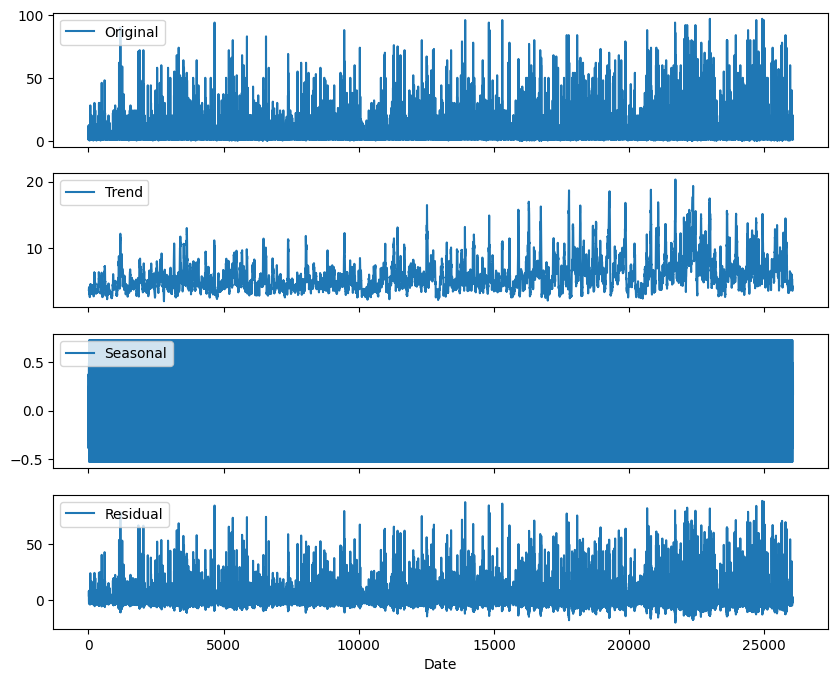

In [67]:
# Perform seasonal decomposition with additive model
result = seasonal_decompose(data['Quantity'], model='additive', period=30)

# Plot the decomposed components
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

ax1.plot(data['Quantity'], label='Original')
ax1.legend(loc='upper left')

ax2.plot(result.trend, label='Trend')
ax2.legend(loc='upper left')

ax3.plot(result.seasonal, label='Seasonal')
ax3.legend(loc='upper left')

ax4.plot(result.resid, label='Residual')
ax4.legend(loc='upper left')

plt.xlabel('Date')
plt.show()

* If the residual component is dominant in the original plot, it suggests that the variability in the time series is not explained well by the trend and seasonal components. The remaining fluctuations are captured in the residual component.

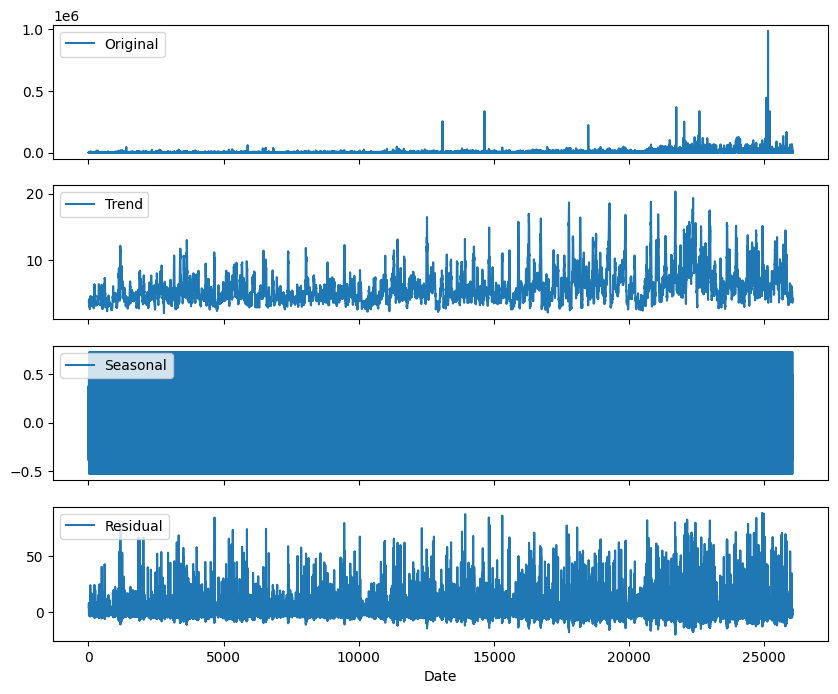

In [68]:
# Performing seasonal decomposition with 'stl' model
result = seasonal_decompose(data['Quantity'], model='stl', period=30)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

ax1.plot(data['Price'], label='Original')
ax1.legend(loc='upper left')

ax2.plot(result.trend, label='Trend')
ax2.legend(loc='upper left')

ax3.plot(result.seasonal, label='Seasonal')
ax3.legend(loc='upper left')

ax4.plot(result.resid, label='Residual')
ax4.legend(loc='upper left')

plt.xlabel('Date')
plt.show()

# Feature Engineering 

In [69]:
data.reset_index(inplace=True)

In [70]:
# Extracting day of the week and create a new column ( We can check the demand over weekday vs Weekend )

data['day_of_week'] = data['Date'].dt.day_name()

In [71]:
# Creating a new column 'is_weekend' with 1 for weekends and 0 for weekdays
data['is_weekend'] = (data['Date'].dt.dayofweek >= 5).astype(int)

data.head()

,index,Date,SKU,Price,Quantity,Discount,year,quarter,month,week,day,day_of_week,is_weekend
0,0,2019-01-01,2647,635.593220,1.0,114.406780,2019,1,1,1,1,Tuesday,0
1,1,2019-01-02,1116,1041.245763,1.0,187.424237,2019,1,1,1,2,Wednesday,0
2,2,2019-01-02,1136,1135.593220,4.0,204.406780,2019,1,1,1,2,Wednesday,0
3,3,2019-01-02,118,283.898305,1.0,51.101695,2019,1,1,1,2,Wednesday,0
4,4,2019-01-02,1234,440.677966,1.0,79.322034,2019,1,1,1,2,Wednesday,0


In [72]:
data.columns

Index(['index', 'Date', 'SKU', 'Price', 'Quantity', 'Discount', 'year',
       'quarter', 'month', 'week', 'day', 'day_of_week', 'is_weekend'],
      dtype='object')

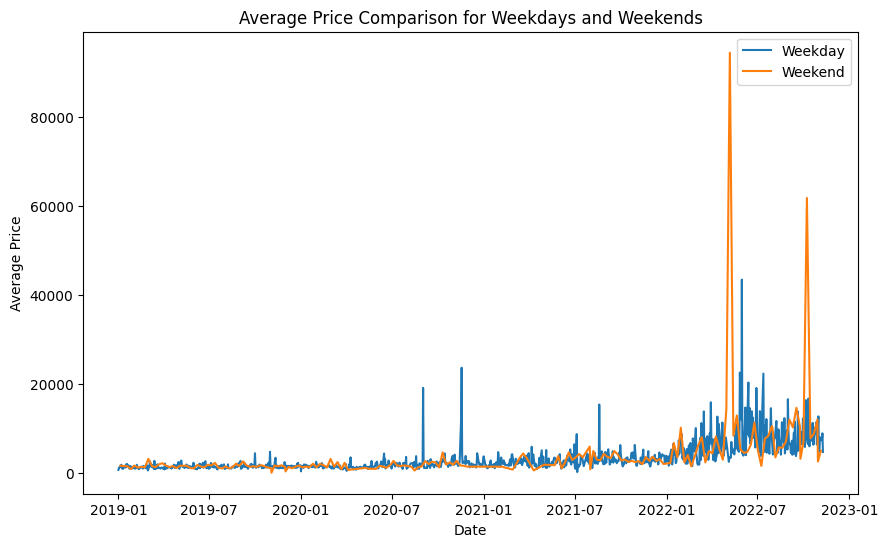

In [73]:
# Group by 'date' and 'is_weekend', then calculate the average price for each group
grouped_data = data.groupby(['Date', 'is_weekend'])['Price'].mean().reset_index()

# Plotting
plt.figure(figsize=(10, 6))

# Plot weekday prices
plt.plot(grouped_data[grouped_data['is_weekend'] == 0]['Date'],
         grouped_data[grouped_data['is_weekend'] == 0]['Price'],
         label='Weekday')

# Plot weekend prices
plt.plot(grouped_data[grouped_data['is_weekend'] == 1]['Date'],
         grouped_data[grouped_data['is_weekend'] == 1]['Price'],
         label='Weekend')

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.title('Average Price Comparison for Weekdays and Weekends')
plt.legend()

# Show the plot
plt.show()

* We can clearly see the demand across weekend is more than demand across weekday 

In [74]:
# creating discount percentage

data['Discount Percentage'] = (data['Discount'] / data['Price']) * 100

In [75]:
# Calculating average discount percentage for each SKU
sku_discount_percentage = data.groupby('SKU')['Discount Percentage'].mean().reset_index()

# Sorting SKUs based on average discount percentage in descending order
sku_discount_percentage = sku_discount_percentage.sort_values(by='Discount Percentage', ascending=False)

fig = px.bar(sku_discount_percentage, x='SKU', y='Discount Percentage', title='Average Discount Percentage by SKU',
             labels={'Discount Percentage': 'Average Discount Percentage', 'SKU': 'SKU'},
             color='Discount Percentage', color_continuous_scale='viridis')

fig.update_layout(xaxis=dict(type='category'), xaxis_title='SKU', yaxis_title='Average Discount Percentage')
fig.show()

In [76]:
# creating price_per_unit 

data['Price_per_Unit'] = data['Price'] / data['Quantity']

##### Lag Features:
Lag features in time series analysis involve shifting the values of a variable across time, providing valuable insights into temporal patterns. By creating lag features, we can capture historical information and temporal dependencies, enabling the incorporation of past observations into the current dataset. This proves beneficial for various applications, particularly in forecasting models, where understanding the sequential nature of data is crucial. For instance, the creation of a lag feature like 'lag_7' involves shifting the values of a variable, such as 'Price' or 'Quantity,' seven time points backward, facilitating the exploration of trends and seasonality over a weekly period. This technique enhances the model's ability to recognize and leverage historical patterns, contributing to more robust predictions.

##### Expanding Mean:
Expanding mean, also known as the cumulative moving average, is a statistical method used to analyze trends in time series data by calculating the mean of all previous observations up to a given point. This approach allows for the consideration of the entire historical context, offering a broader perspective on the dataset's overall behavior. Expanding mean is particularly useful for identifying long-term trends and smoothing out short-term fluctuations. In the context of time series analysis, applying the expanding mean to a variable, such as 'Price_per_Unit,' involves continuously updating the mean as new observations become available. This provides a dynamic measure of the average behavior over time, contributing to a comprehensive understanding of the dataset's evolving patterns.

##### Rolling Mean:
Rolling mean, or moving average, is a statistical technique used to analyze trends and patterns in time series data by calculating the mean of a specific window of consecutive observations. The window, or "rolling window," moves forward through the dataset, smoothing out short-term fluctuations and highlighting underlying trends. Rolling mean is valuable for capturing cyclic patterns, seasonality, and fluctuations that occur within a specified time frame. In the context of time series analysis, creating a rolling mean feature, such as 'rolling_mean_7,' involves calculating the mean of 'Price_per_Unit' over a rolling window of seven observations. This rolling average provides a smoothed representation of the variable, facilitating the identification of trends and patterns over shorter periods. The flexibility of adjusting the window size allows analysts to balance sensitivity to short-term changes with a broader view of the dataset's overall behavior.

In [77]:
# Creating lag_7
data['lag_7'] = data['Price_per_Unit'].shift(7)

# Creating rolling mean with window size 7
data['rolling_mean_7'] = data['Price_per_Unit'].rolling(window=7).mean()

# Creating expanding mean with a minimum period of 2
data['expanding_mean_2'] = data['Price_per_Unit'].expanding(min_periods=2).mean()

In [78]:
data.head()

,index,Date,SKU,Price,Quantity,Discount,year,quarter,month,week,day,day_of_week,is_weekend,Discount Percentage,Price_per_Unit,lag_7,rolling_mean_7,expanding_mean_2
0,0,2019-01-01,2647,635.593220,1.0,114.406780,2019,1,1,1,1,Tuesday,0,18.0,635.593220,NaN,NaN,NaN
1,1,2019-01-02,1116,1041.245763,1.0,187.424237,2019,1,1,1,2,Wednesday,0,18.0,1041.245763,NaN,NaN,838.419491
2,2,2019-01-02,1136,1135.593220,4.0,204.406780,2019,1,1,1,2,Wednesday,0,18.0,283.898305,NaN,NaN,653.579096
3,3,2019-01-02,118,283.898305,1.0,51.101695,2019,1,1,1,2,Wednesday,0,18.0,283.898305,NaN,NaN,561.158898
4,4,2019-01-02,1234,440.677966,1.0,79.322034,2019,1,1,1,2,Wednesday,0,18.0,440.677966,NaN,NaN,537.062712


In [79]:
data.columns

Index(['index', 'Date', 'SKU', 'Price', 'Quantity', 'Discount', 'year',
       'quarter', 'month', 'week', 'day', 'day_of_week', 'is_weekend',
       'Discount Percentage', 'Price_per_Unit', 'lag_7', 'rolling_mean_7',
       'expanding_mean_2'],
      dtype='object')

In [80]:
# remove day of the week 

data.drop(columns=["day_of_week"],axis=1,inplace=True)

In [81]:
data['year'] = data['year'].astype(int)
data['quarter'] = data['quarter'].astype(int)
data['month'] = data['month'].astype(int)
data['week'] = data['week'].astype(int)
data['day'] = data['day'].astype(int)
data["SKU"] = data["SKU"].astype(int)

In [82]:
np.isinf(data).sum()

index                    0
Date                     0
SKU                      0
Price                    0
Quantity                 0
Discount                 0
year                     0
quarter                  0
month                    0
week                     0
day                      0
is_weekend               0
Discount Percentage    225
Price_per_Unit           0
lag_7                    0
rolling_mean_7           0
expanding_mean_2         0
dtype: int64

In [83]:
# converting inf into nan
data["Discount Percentage"] = data["Discount Percentage"].replace([np.inf, -np.inf], np.nan)

In [84]:
np.isinf(data).sum()

index                  0
Date                   0
SKU                    0
Price                  0
Quantity               0
Discount               0
year                   0
quarter                0
month                  0
week                   0
day                    0
is_weekend             0
Discount Percentage    0
Price_per_Unit         0
lag_7                  0
rolling_mean_7         0
expanding_mean_2       0
dtype: int64

In [85]:
data.isnull().sum()

index                    0
Date                     0
SKU                      0
Price                    0
Quantity                 0
Discount                 0
year                     0
quarter                  0
month                    0
week                     0
day                      0
is_weekend               0
Discount Percentage    501
Price_per_Unit         130
lag_7                  137
rolling_mean_7         684
expanding_mean_2         1
dtype: int64

In [86]:
data.dropna(inplace=True)

In [87]:
data.columns

Index(['index', 'Date', 'SKU', 'Price', 'Quantity', 'Discount', 'year',
       'quarter', 'month', 'week', 'day', 'is_weekend', 'Discount Percentage',
       'Price_per_Unit', 'lag_7', 'rolling_mean_7', 'expanding_mean_2'],
      dtype='object')

In [88]:
data.drop(columns=["Discount"],axis=1,inplace=True)

In [89]:
data.to_csv(r"C:\Users\KeesaramRupesh\OneDrive - Xformics Inc\Documents\Data Science\PrepVector_Portfolio\Demand Forecasting\featured_data.csv")

## Prework for AR / MA / ARMA / ARIMA Models

<Figure size 1200x400 with 0 Axes>

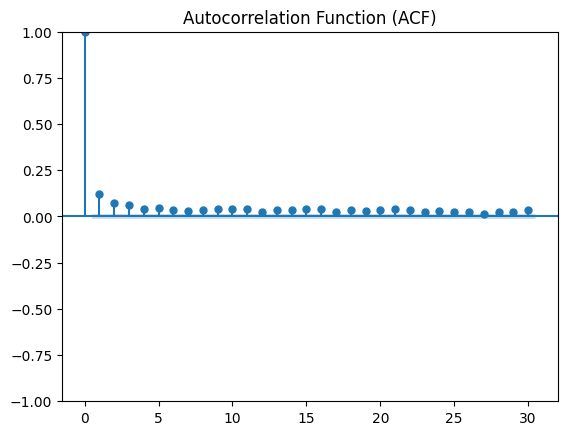

<Figure size 1200x400 with 0 Axes>

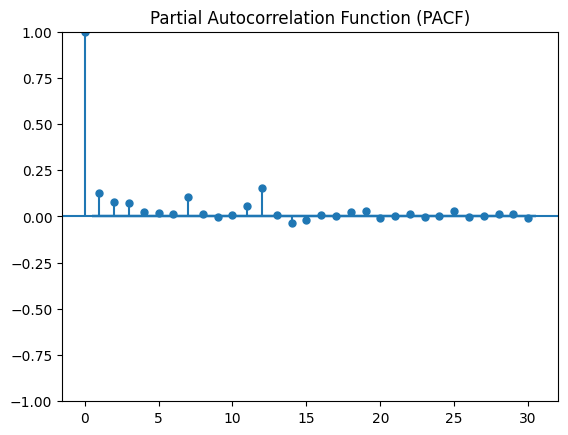

In [90]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

# Plot ACF
plt.figure(figsize=(12, 4))
plot_acf(data['Quantity'], lags=30, title='Autocorrelation Function (ACF)')
plt.show()

# Plot PACF
plt.figure(figsize=(12, 4))
plot_pacf(df['Quantity'], lags=30, title='Partial Autocorrelation Function (PACF)')
plt.show()

In [91]:
from sklearn.model_selection import train_test_split

In [92]:
temp = data.copy()

In [93]:
# Calculate the index to split the data
split_index = int(0.8 * len(data))

# Split the data into training and testing sets
train_data = data[:split_index]
test_data = data[split_index:]

<IPython.core.display.Javascript object>

                               SARIMAX Results                                
Dep. Variable:               Quantity   No. Observations:                19831
Model:                 ARIMA(3, 1, 3)   Log Likelihood              -69145.622
Date:                Sat, 09 Mar 2024   AIC                         138305.245
Time:                        20:35:52   BIC                         138360.509
Sample:                             0   HQIC                        138323.333
                              - 19831                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1540      0.075    -15.382      0.000      -1.301      -1.007
ar.L2         -0.7286      0.072    -10.073      0.000      -0.870      -0.587
ar.L3          0.1043      0.008     13.562      0.0

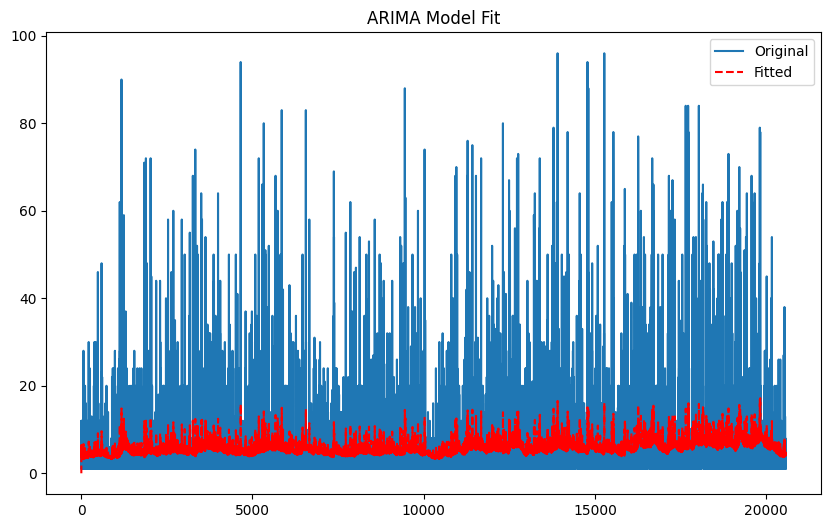

In [94]:
# Define the ARIMA order
order = (3, 1, 3)

# Create and fit the ARIMA model
model = sm.tsa.ARIMA(train_data['Quantity'], order=order)
results = model.fit()

# Display model summary
print(results.summary())

# Plot the original time series and the fitted values
plt.figure(figsize=(10, 6))
plt.plot(train_data['Quantity'], label='Original')
plt.plot(results.fittedvalues, color='red', label='Fitted', linestyle='dashed')
plt.legend()
plt.title('ARIMA Model Fit')
plt.show()

In [95]:
from sklearn.metrics import mean_squared_error
from math import sqrt

# Predict on the test_data
predicted_values = results.predict(start=0, end=test_data.shape[0]-1, typ='levels')

# Create a DataFrame to compare actual and predicted values
comparison_df = pd.DataFrame({'Actual': test_data['Quantity'].values, 'Predicted': predicted_values})

# Calculate RMSE
rmse = sqrt(mean_squared_error(test_data['Quantity'], predicted_values))
print(f'RMSE: {rmse}')

# Display the comparison DataFrame
comparison_df.head()

RMSE: 12.41772869205395


,Actual,Predicted
7,8.0,0.000000
8,4.0,3.999799
9,4.0,2.345082
10,2.0,6.471959
11,4.0,5.078045


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Best ARIMA Order: (2, 0, 2)
RMSE: 7.890182072425563


<IPython.core.display.Javascript object>

                               SARIMAX Results                                
Dep. Variable:               Quantity   No. Observations:                19831
Model:                 ARIMA(2, 0, 2)   Log Likelihood              -69102.311
Date:                Sat, 09 Mar 2024   AIC                         138216.621
Time:                        20:38:14   BIC                         138263.991
Sample:                             0   HQIC                        138232.126
                              - 19831                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.5913      0.210     26.615      0.000       5.180       6.003
ar.L1          1.2643      0.077     16.461      0.000       1.114       1.415
ar.L2         -0.2842      0.073     -3.899      0.0

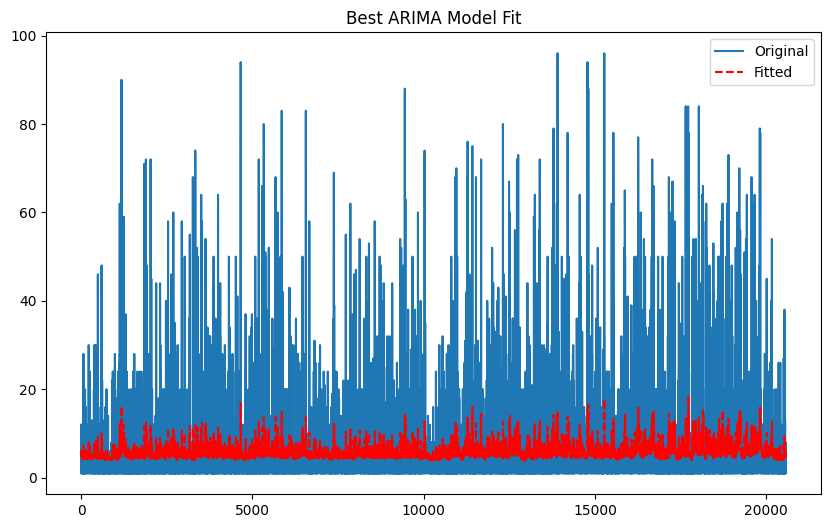

In [96]:
# Define a range of values for p, d, and q (ARIMA order)
p_values = range(3)
d_values = range(2)  # Adjust based on your data
q_values = range(3)

# Initialize variables to store best order and corresponding RMSE
best_order = None
best_rmse = float('inf')

# Iterate over possible orders
for p in p_values:
    for d in d_values:
        for q in q_values:
            order = (p, d, q)
            
            # Skip orders with d > 0 if d_values is not [0, 1, 2, ...]
            if d > 0 and d not in d_values:
                continue
            
            # Create and fit the ARIMA model
            model = sm.tsa.ARIMA(train_data['Quantity'], order=order)
            results = model.fit()

            # Predict on the train_data to compute RMSE
            predicted_values = results.predict(start=0, end=len(train_data)-1, typ='levels')
            rmse = sqrt(mean_squared_error(train_data['Quantity'], predicted_values))
            
            # Update best order if current RMSE is better
            if rmse < best_rmse:
                best_rmse = rmse
                best_order = order

# Print the best order and its corresponding RMSE
print(f'Best ARIMA Order: {best_order}')
print(f'RMSE: {best_rmse}')

# Create and fit the ARIMA model with the best order
best_model = sm.tsa.ARIMA(train_data['Quantity'], order=best_order)
best_results = best_model.fit()

# Display model summary
print(best_results.summary())

# Plot the original time series and the fitted values with the best model
plt.figure(figsize=(10, 6))
plt.plot(train_data['Quantity'], label='Original')
plt.plot(best_results.fittedvalues, color='red', label='Fitted', linestyle='dashed')
plt.legend()
plt.title('Best ARIMA Model Fit')
plt.show()

In [97]:
from sklearn.metrics import mean_squared_error
from math import sqrt

# Predict on the test_data
predicted_values = best_results.predict(start=0, end=test_data.shape[0]-1, typ='levels')

# Create a DataFrame to compare actual and predicted values
comparison_df = pd.DataFrame({'Actual': test_data['Quantity'].values, 'Predicted': predicted_values})

# Calculate RMSE
rmse = sqrt(mean_squared_error(test_data['Quantity'], predicted_values))
print(f'RMSE: {rmse}')

# Display the comparison DataFrame
comparison_df.head()

RMSE: 12.365441602027397


,Actual,Predicted
7,8.0,5.591337
8,4.0,5.397288
9,4.0,4.979644
10,2.0,6.056287
11,4.0,5.513969


In [98]:
best_results.save('best_arima_model.pkl')

# Random Forest

In [312]:
X = data.drop(['index','SKU', 'Quantity'], axis=1)
y = data['Quantity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [313]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import pandas as pd

# Assuming your data is stored in a DataFrame called 'df'
# Make sure to drop unnecessary columns and handle missing values

# Define features (X) and target variable (y)
X = data.drop(['index', 'Date', 'Quantity'], axis=1)
y = data['Quantity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [314]:
# Make predictions on the test set
y_pred = rf_model.predict(X_test)

comparision_df = pd.DataFrame({"Actual":y_test,"Predicted":y_pred})

comparision_df.head()

,Actual,Predicted
3715,4.0,4.00
7142,2.0,2.00
24192,4.0,4.00
18526,1.0,1.00
23183,4.0,3.97


In [315]:
# Model Evaluation 

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 1.1922932898850342


In [316]:
# We can also inspect feature importances ( We can select the most importance features & can build some ML models on top of these selected features )
feature_importances = pd.Series(rf_model.feature_importances_, index=X.columns)
print('Feature Importances:')
print(feature_importances)

Feature Importances:
SKU                    0.000718
Price                  0.525385
year                   0.000137
quarter                0.000127
month                  0.000276
week                   0.000592
day                    0.000745
is_weekend             0.000128
Discount Percentage    0.000525
Price_per_Unit         0.467641
lag_7                  0.000932
rolling_mean_7         0.001542
expanding_mean_2       0.001251
dtype: float64


In [317]:
# Saving the Random Forest model using pickle
with open('random_forest_model.pkl', 'wb') as model_file:
    pickle.dump(rf_model, model_file)

<IPython.core.display.Javascript object>

In [318]:
# just for checking

X_test.head(1)

,SKU,Price,year,quarter,month,week,day,is_weekend,Discount Percentage,Price_per_Unit,lag_7,rolling_mean_7,expanding_mean_2
3715,481,627.118644,2019,2,6,26,27,0,18.0,156.779661,152.542373,227.587458,358.611649


In [319]:
y_test.head(1)

3715    4.0
Name: Quantity, dtype: float64

In [320]:
# Predicting one record

rf_model.predict([[481,627.118644,2019,2,6,26,27,0,18.0,156.779661,152.542373,227.587458,358.611649]])

array([4.])